# Data extracting/visualization

## Darian Kacanski

# 11/11/2025

## Importing libraries

In [33]:
import requests
from bs4 import BeautifulSoup as bs
import pandas as pd
import time

## grabbing first link

In [2]:
url = "https://en.wikipedia.org/wiki/List_of_American_films_of_2020"

headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/120.0.0.0 Safari/537.36"
}

response = requests.get(url, headers=headers)
status = response.status_code

if status == 200:
    page = response.text
    soup = bs(page, "html.parser")
    print(" Success! Page loaded.")
else:
    print(f" Oops! Received status code {status}")


 Success! Page loaded.


## using beautiful soup to navigate HTML

In [3]:
print(soup.prettify())
type(soup)

<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-sticky-header-enabled vector-toc-available" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of American films of 2020 - Wikipedia
  </title>
  <script>
   (function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limite

bs4.BeautifulSoup

## getting the table from the URL

### I had to use much more code because wikipedia used rowspan which made it harder to grab the rows

#### I had AI help me progress through this issue

In [38]:
# making a empty list
movie_list = []
#finding class name named wikitable 
table = soup.find("table", class_="wikitable").tbody
#this is AI made but variables to help handle row span
carry_distributor = None
carry_left = 0
#loop through the table
for tr in table.find_all("tr"):
    tds = tr.find_all("td")
    # This is to handle the row spans
    if len(tds) < 3:        # skip non-data rows
        continue

    Rank  = tds[0].get_text(strip=True)
    Title = tds[1].get_text(strip=True)
    #this is to go through with normal rows without rowspan
    if len(tds) == 4:       # distributor cell present
        dist_td = tds[2]
        Distributor = dist_td.get_text(strip=True)
        Gross = tds[3].get_text(strip=True)

        # start/refresh carry if this cell has a rowspan
        if dist_td.has_attr("rowspan"):
            carry_left = int(dist_td["rowspan"]) - 1
            carry_distributor = Distributor
        else:
            carry_left = 0
            carry_distributor = None
    #If the row has 3 columns, that means it is shared
    else:                   # len(tds) == 3 -> distributor omitted due to rowspan
        Distributor = carry_distributor
        Gross = tds[2].get_text(strip=True)
        if carry_left >   0:
            carry_left -= 1
            if carry_left == 0:
                carry_distributor = None
    #make the information into a list
    movie_list.append({
        "Rank": Rank, "Title": Title,
        "Distributor": Distributor, "Domestic Gross": Gross
    })
#print list to make sure it worked
print(movie_list)

movie_df_2020 = pd.DataFrame(movie_list)

[{'Rank': 'A Minecraft Movie', 'Title': 'Warner Bros.', 'Distributor': None, 'Domestic Gross': '$423,949,195'}, {'Rank': 'Lilo & Stitch', 'Title': 'Disney', 'Distributor': None, 'Domestic Gross': '$423,778,855'}, {'Rank': 'Superman', 'Title': 'Warner Bros.', 'Distributor': None, 'Domestic Gross': '$354,184,465'}, {'Rank': 'Jurassic World Rebirth', 'Title': 'Universal', 'Distributor': None, 'Domestic Gross': '$339,640,400'}, {'Rank': 'Sinners', 'Title': 'Warner Bros.', 'Distributor': None, 'Domestic Gross': '$278,678,513'}, {'Rank': 'The Fantastic Four: First Steps', 'Title': 'Disney', 'Distributor': None, 'Domestic Gross': '$274,286,610'}, {'Rank': 'How to Train Your Dragon', 'Title': 'Universal', 'Distributor': None, 'Domestic Gross': '$262,958,100'}, {'Rank': 'Captain America: Brave New World', 'Title': 'Disney', 'Distributor': None, 'Domestic Gross': '$200,500,001'}, {'Rank': 'Mission: Impossible – The Final Reckoning', 'Title': 'Paramount', 'Distributor': None, 'Domestic Gross': '$

## what the data looks like in a dataframe

In [5]:
movie_df_2020

,Rank,Title,Distributor,Domestic Gross
0,1,Bad Boys for Life,Sony,"$206,305,244"
1,2,Sonic the Hedgehog,Paramount,"$148,974,665"
2,3,Birds of Prey,Warner Bros.,"$84,172,791"
3,4,Dolittle,Universal,"$77,047,065"
4,5,The Invisible Man,Universal,"$70,410,000"
5,6,The Call of the Wild,20th Century,"$62,342,368"
6,7,Onward,Disney,"$61,555,145"
7,8,The Croods: A New Age,Universal,"$58,592,120"
8,9,Tenet,Warner Bros.,"$58,456,624"
9,10,Wonder Woman 1984,Warner Bros.,"$46,801,036"


# Grabbing link 

In [6]:
url = "https://en.wikipedia.org/wiki/List_of_American_films_of_2021"

headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/120.0.0.0 Safari/537.36"
}

response = requests.get(url, headers=headers)
status = response.status_code

if status == 200:
    page = response.text
    soup = bs(page, "html.parser")
    print(" Success! Page loaded.")
else:
    print(f" Oops! Received status code {status}")


 Success! Page loaded.


# using pretty soup

In [7]:
print(soup.prettify())
type(soup)

<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-sticky-header-enabled vector-toc-available" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of American films of 2021 - Wikipedia
  </title>
  <script>
   (function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limite

bs4.BeautifulSoup

## scraping the data from URL 2021

### I having trouble grabbing the table because I was grabbing a different table so I had AI help.

#### This was easier because no rowspans

In [8]:
# Find the right table
tables = soup.find_all("table", class_="wikitable")
# to store the table
wikitable = None
# Used captions to find the title of table
for t in tables:
    cap = t.find("caption")
    if cap and "Highest-grossing films of 2021" in cap.get_text(strip=True):
        wikitable = t.tbody
        break
# if couldn't find the table I have this if
if not wikitable:
    raise ValueError("Could not find the Box Office table.")

# Extract rows, including the rank <th> and rowspan fix
movie_list = []
last_dist = None
# loop through the rows
for row in wikitable.find_all("tr"):
    cells = row.find_all(["th", "td"])
    # skip empty I only have this as a precaution becuase it was somehow grabbing a different table with my other code 
    if not cells:
        continue
    # Skip header row for rank and title
    if cells[0].name == "th" and cells[0].get_text(strip=True).lower() in {"rank", "title"}:
        continue
    #handling normal without rowspan
    if len(cells) >= 4:
        rank  = cells[0].get_text(strip=True)
        title = cells[1].get_text(strip=True)
        dist  = cells[2].get_text(strip=True)
        gross = cells[3].get_text(strip=True)
        last_dist = dist
        # handling rowspan
    elif len(cells) == 3:
        rank  = cells[0].get_text(strip=True)
        title = cells[1].get_text(strip=True)
        dist  = last_dist
        gross = cells[2].get_text(strip=True)
    else:
        continue
    #making a list 
    movie_list.append({
        "Rank": rank,
        "Title": title,
        "Distributor": dist,
        "Domestic Gross": gross
    })
#printing the table
import pandas as pd
movie_df_2021 = pd.DataFrame(movie_list)
movie_df_2021



,Rank,Title,Distributor,Domestic Gross
0,1,Spider-Man: No Way Home,Sony,"$804,617,772"
1,2,Shang-Chi and the Legend of the Ten Rings,Disney,"$224,886,280"
2,3,Venom: Let There Be Carnage,Sony,"$213,550,366"
3,4,Black Widow,Disney,"$183,651,655"
4,5,F9,Universal,"$173,005,945"
5,6,Eternals,Disney,"$164,870,234"
6,7,Sing 2,Universal,"$162,790,990"
7,8,No Time to Die,MGM/Universal,"$160,891,007"
8,9,A Quiet Place Part II,Paramount,"$160,072,261"
9,10,Ghostbusters: Afterlife,Sony,"$129,360,575"


## This is to grab the code for 2022

In [9]:
url = "https://en.wikipedia.org/wiki/List_of_American_films_of_2022"

headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/120.0.0.0 Safari/537.36"
}

response = requests.get(url, headers=headers)
status = response.status_code

if status == 200:
    page = response.text
    soup = bs(page, "html.parser")
    print(" Success! Page loaded.")
else:
    print(f" Oops! Received status code {status}")

 Success! Page loaded.


## using pretty soup

In [10]:
print(soup.prettify())
type(soup)

<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-sticky-header-enabled vector-toc-available" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of American films of 2022 - Wikipedia
  </title>
  <script>
   (function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limite

bs4.BeautifulSoup

## This code was same as 2020 but just reformatted code

In [11]:
# empty String
movie_list = []
table = soup.find("table", class_="wikitable").tbody
#variables
carry_distributor = None
carry_left = 0
#for loop to get data
for tr in table.find_all("tr"):
    cells = tr.find_all(["th","td"])
    if len(tds) < 3:        # skip non-data rows
        continue

    Rank  = cells[0].get_text(strip=True)
    Title = cells[1].get_text(strip=True)
    # to handle cells
    if len(cells) >= 4:       # distributor cell present
        dist_td = cells[2]
        Distributor = dist_td.get_text(strip=True)
        Gross = cells[3].get_text(strip=True)

        # start/refresh carry if this cell has a rowspan
        if dist_td.has_attr("rowspan"):
            carry_left = int(dist_td["rowspan"]) - 1
            carry_distributor = Distributor
        else:
            carry_left = 0
            carry_distributor = None

    else:                   # len(tds) == 3 -> distributor omitted due to rowspan
        Distributor = carry_distributor
        Gross = cells[2].get_text(strip=True)
        if carry_left >   0:
            carry_left -= 1
            if carry_left == 0:
                carry_distributor = None

    movie_list.append({
        "Rank": Rank, "Title": Title,
        "Distributor": Distributor, "Domestic Gross": Gross
    })

print(movie_list)

[{'Rank': 'Rank', 'Title': 'Title', 'Distributor': 'Distributor', 'Domestic Gross': 'Domestic gross'}, {'Rank': '1', 'Title': 'Top Gun: Maverick', 'Distributor': 'Paramount', 'Domestic Gross': '$718,732,821'}, {'Rank': '2', 'Title': 'Avatar: The Way of Water', 'Distributor': '20th Century Studios', 'Domestic Gross': '$684,075,767'}, {'Rank': '3', 'Title': 'Black Panther: Wakanda Forever', 'Distributor': 'Disney', 'Domestic Gross': '$453,829,060'}, {'Rank': '4', 'Title': 'Doctor Strange in the Multiverse of Madness', 'Distributor': 'Disney', 'Domestic Gross': '$411,331,607'}, {'Rank': '5', 'Title': 'Jurassic World Dominion', 'Distributor': 'Universal', 'Domestic Gross': '$376,851,080'}, {'Rank': '6', 'Title': 'Minions: The Rise of Gru', 'Distributor': 'Universal', 'Domestic Gross': '$369,695,210'}, {'Rank': '7', 'Title': 'The Batman', 'Distributor': 'Warner Bros.', 'Domestic Gross': '$369,345,583'}, {'Rank': '8', 'Title': 'Thor: Love and Thunder', 'Distributor': 'Disney', 'Domestic Gros

## put dataframe into movie variable to use later to combine

### I got the headers but I will fix when I do the cleaning 

In [12]:
movie_df_2022 = pd.DataFrame(movie_list)
movie_df_2022

,Rank,Title,Distributor,Domestic Gross
0,Rank,Title,Distributor,Domestic gross
1,1,Top Gun: Maverick,Paramount,"$718,732,821"
2,2,Avatar: The Way of Water,20th Century Studios,"$684,075,767"
3,3,Black Panther: Wakanda Forever,Disney,"$453,829,060"
4,4,Doctor Strange in the Multiverse of Madness,Disney,"$411,331,607"
5,5,Jurassic World Dominion,Universal,"$376,851,080"
6,6,Minions: The Rise of Gru,Universal,"$369,695,210"
7,7,The Batman,Warner Bros.,"$369,345,583"
8,8,Thor: Love and Thunder,Disney,"$343,256,830"
9,9,Sonic the Hedgehog 2,Paramount,"$190,872,904"


## Getting the link and doing beautiful soup in same step

In [13]:
url = "https://en.wikipedia.org/wiki/List_of_American_films_of_2023"

headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/120.0.0.0 Safari/537.36"
}

response = requests.get(url, headers=headers)
status = response.status_code

if status == 200:
    page = response.text
    soup = bs(page, "html.parser")
    print(" Success! Page loaded.")
else:
    print(f" Oops! Received status code {status}")
print(soup.prettify())
type(soup)

 Success! Page loaded.
<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-sticky-header-enabled vector-toc-available" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of American films of 2023 - Wikipedia
  </title>
  <script>
   (function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-

bs4.BeautifulSoup

# this is the same as 2021 I just reformatted for 2023 because tables were the same

In [14]:
# Find the right table
tables = soup.find_all("table", class_="wikitable")
# variable for wikitable
wikitable = None
# this is to get the table title
for t in tables:
    cap = t.find("caption")
    if cap and "Highest-grossing films of 2023" in cap.get_text(strip=True):
        wikitable = t.tbody
        break
# if couldn't get it have a fallback
if not wikitable:
    raise ValueError("Could not find the Box Office table.")

# Extract rows, including the rank <th> and rowspan fix
movie_list = []
last_dist = None
#grab the data from the table
for row in wikitable.find_all("tr"):
    cells = row.find_all(["th", "td"])
    if not cells:
        continue
    if cells[0].name == "th" and cells[0].get_text(strip=True).lower() in {"rank", "title"}:
        continue

    if len(cells) >= 4:
        rank  = cells[0].get_text(strip=True)
        title = cells[1].get_text(strip=True)
        dist  = cells[2].get_text(strip=True)
        gross = cells[3].get_text(strip=True)
        last_dist = dist
    elif len(cells) == 3:
        rank  = cells[0].get_text(strip=True)
        title = cells[1].get_text(strip=True)
        dist  = last_dist
        gross = cells[2].get_text(strip=True)
    else:
        continue

    movie_list.append({
        "Rank": rank,
        "Title": title,
        "Distributor": dist,
        "Domestic Gross": gross
    })

import pandas as pd
movie_df_2023 = pd.DataFrame(movie_list)
movie_df_2023

,Rank,Title,Distributor,Domestic Gross
0,1,Barbie,Warner Bros.,"$636,236,401"
1,2,The Super Mario Bros. Movie,Universal,"$574,934,330"
2,3,Spider-Man: Across the Spider-Verse,Sony,"$381,593,754"
3,4,Guardians of the Galaxy Vol. 3,Disney,"$358,995,815"
4,5,Oppenheimer,Universal,"$329,862,540"
5,6,The Little Mermaid,Disney,"$298,172,056"
6,7,Wonka,Warner Bros.,"$218,377,073"
7,8,Ant-Man and the Wasp: Quantumania,Disney,"$214,506,909"
8,9,John Wick: Chapter 4,Lionsgate,"$187,131,806"
9,10,Sound of Freedom,Angel Studios,"$184,174,617"


##  getting link for 2024 and using beautiful soup   

In [15]:
url = "https://en.wikipedia.org/wiki/List_of_American_films_of_2024"

headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/120.0.0.0 Safari/537.36"
}

response = requests.get(url, headers=headers)
status = response.status_code

if status == 200:
    page = response.text
    soup = bs(page, "html.parser")
    print(" Success! Page loaded.")
else:
    print(f" Oops! Received status code {status}")
print(soup.prettify())
type(soup)

 Success! Page loaded.
<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-sticky-header-enabled vector-toc-available" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of American films of 2024 - Wikipedia
  </title>
  <script>
   (function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-

bs4.BeautifulSoup

## Same code for table 2020 to handle rowspan

In [16]:
#empty list
movie_list = []
# this it help find the table
table = soup.find("table", class_="wikitable").tbody
#variables for to help handle rowspan
carry_distributor = None
carry_left = 0
# this is to get the data
for tr in table.find_all("tr"):
    cells = tr.find_all(["th","td"])
    if len(tds) < 3:        # skip non-data rows
        continue

    Rank  = cells[0].get_text(strip=True)
    Title = cells[1].get_text(strip=True)

    if len(cells) >= 4:       # distributor cell present
        dist_td = cells[2]
        Distributor = dist_td.get_text(strip=True)
        Gross = cells[3].get_text(strip=True)

        # start/refresh carry if this cell has a rowspan
        if dist_td.has_attr("rowspan"):
            carry_left = int(dist_td["rowspan"]) - 1
            carry_distributor = Distributor
        else:
            carry_left = 0
            carry_distributor = None

    else:                   # len(tds) == 3 -> distributor omitted due to rowspan
        Distributor = carry_distributor
        Gross = cells[2].get_text(strip=True)
        if carry_left >   0:
            carry_left -= 1
            if carry_left == 0:
                carry_distributor = None

    movie_list.append({
        "Rank": Rank, "Title": Title,
        "Distributor": Distributor, "Domestic Gross": Gross
    })
print(movie_list)

[{'Rank': 'Rank', 'Title': 'Title', 'Distributor': 'Distributor', 'Domestic Gross': 'Domestic gross'}, {'Rank': '1', 'Title': 'Inside Out 2', 'Distributor': 'Disney', 'Domestic Gross': '$652,980,194'}, {'Rank': '2', 'Title': 'Deadpool & Wolverine', 'Distributor': 'Disney', 'Domestic Gross': '$636,742,741'}, {'Rank': '3', 'Title': 'Wicked', 'Distributor': 'Universal', 'Domestic Gross': '$473,231,120'}, {'Rank': '4', 'Title': 'Moana 2', 'Distributor': 'Disney', 'Domestic Gross': '$460,405,297'}, {'Rank': '5', 'Title': 'Despicable Me 4', 'Distributor': 'Universal', 'Domestic Gross': '$361,004,205'}, {'Rank': '6', 'Title': 'Beetlejuice Beetlejuice', 'Distributor': 'Warner Bros.', 'Domestic Gross': '$294,097,060'}, {'Rank': '7', 'Title': 'Dune: Part Two', 'Distributor': 'Warner Bros.', 'Domestic Gross': '$282,144,358'}, {'Rank': '8', 'Title': 'Twisters', 'Distributor': 'Universal', 'Domestic Gross': '$267,762,265'}, {'Rank': '9', 'Title': 'Mufasa: The Lion King', 'Distributor': 'Disney', 'D

# this is it in a dataframe is also got the heading I can clean after I scrape all the websites

In [17]:
movie_df_2024 = pd.DataFrame(movie_list)
movie_df_2024

,Rank,Title,Distributor,Domestic Gross
0,Rank,Title,Distributor,Domestic gross
1,1,Inside Out 2,Disney,"$652,980,194"
2,2,Deadpool & Wolverine,Disney,"$636,742,741"
3,3,Wicked,Universal,"$473,231,120"
4,4,Moana 2,Disney,"$460,405,297"
5,5,Despicable Me 4,Universal,"$361,004,205"
6,6,Beetlejuice Beetlejuice,Warner Bros.,"$294,097,060"
7,7,Dune: Part Two,Warner Bros.,"$282,144,358"
8,8,Twisters,Universal,"$267,762,265"
9,9,Mufasa: The Lion King,Disney,"$254,567,693"


## This is to grab the url for 2025 and using beautiful soup

In [18]:
url = "https://en.wikipedia.org/wiki/List_of_American_films_of_2025"

headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/120.0.0.0 Safari/537.36"
}

response = requests.get(url, headers=headers)
status = response.status_code

if status == 200:
    page = response.text
    soup = bs(page, "html.parser")
    print(" Success! Page loaded.")
else:
    print(f" Oops! Received status code {status}")
print(soup.prettify())
type(soup)

 Success! Page loaded.
<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-sticky-header-enabled vector-toc-available" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of American films of 2025 - Wikipedia
  </title>
  <script>
   (function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-

bs4.BeautifulSoup

## this is similar to what I did for 2021 but couldn't grab the title because they didn't add a title to the table

### I needed help from AI to handle that because the other options I tried it grabbed the wrong table

In [19]:
# Find the right table
tables = soup.find_all("table", class_="wikitable")
wikitable = None

wanted = {"rank", "title", "distributor", "domestic gross"}   # lowercased

for t in tables:
    # collect all header texts from this table
    ths = [th.get_text(strip=True).lower() for th in t.find_all("th")]
    if wanted.issubset(set(ths)):
        wikitable = t.tbody
        break

if not wikitable:
    raise ValueError("Could not find a table with Rank/Title/Distributor/Domestic gross headers.")



# Extract rows, including the rank <th> and rowspan fix
movie_list = []
last_dist = None

for row in wikitable.find_all("tr"):
    cells = row.find_all(["th", "td"])
    if not cells:
        continue
    if cells[0].name == "th" and cells[0].get_text(strip=True).lower() in {"rank", "title"}:
        continue

    if len(cells) >= 4:
        rank  = cells[0].get_text(strip=True)
        title = cells[1].get_text(strip=True)
        dist  = cells[2].get_text(strip=True)
        gross = cells[3].get_text(strip=True)
        last_dist = dist
    elif len(cells) == 3:
        rank  = cells[0].get_text(strip=True)
        title = cells[1].get_text(strip=True)
        dist  = last_dist
        gross = cells[2].get_text(strip=True)
    else:
        continue

    movie_list.append({
        "Rank": rank,
        "Title": title,
        "Distributor": dist,
        "Domestic Gross": gross
    })

import pandas as pd
movie_df_2025 = pd.DataFrame(movie_list)
movie_df_2025


,Rank,Title,Distributor,Domestic Gross
0,1,A Minecraft Movie,Warner Bros.,"$423,949,195"
1,2,Lilo & Stitch,Disney,"$423,778,855"
2,3,Superman,Warner Bros.,"$354,184,465"
3,4,Jurassic World Rebirth,Universal,"$339,640,400"
4,5,Sinners,Warner Bros.,"$278,678,513"
5,6,The Fantastic Four: First Steps,Disney,"$274,286,610"
6,7,How to Train Your Dragon,Universal,"$262,958,100"
7,8,Captain America: Brave New World,Disney,"$200,500,001"
8,9,Mission: Impossible – The Final Reckoning,Paramount,"$197,413,515"
9,10,Thunderbolts*,Disney,"$190,274,328"


## making the columns match

In [63]:

for df in [movie_df_2020, movie_df_2021, movie_df_2022, movie_df_2024, movie_df_2025]:
    df.rename(columns={"Domestic gross": "Domestic Gross"}, inplace=True)
    # drop any header rows that slipped in
    df.drop(df.index[df["Rank"] == "Rank"], inplace=True)

## add the year column so I can do better analysis

In [64]:
movie_df_2020["Year"] = 2020
movie_df_2021["Year"] = 2021
movie_df_2022["Year"] = 2022
movie_df_2024["Year"] = 2024
movie_df_2025["Year"] = 2025

# Combining the dataframes

### I did use a AI I wasn't familiar with the concat function

In [ ]:
# this combines all of dataframes and makes the index match with the combining
all_movies = pd.concat(
    [movie_df_2020, movie_df_2021, movie_df_2022, movie_df_2024, movie_df_2025],
    ignore_index=True
)

# cleaning the data

In [41]:
# Make sure all tables have the same column titles
all_movies.rename(columns={"Domestic gross": "Domestic Gross"}, inplace=True)


# Sometimes the word "Rank" shows up inside the data
all_movies = all_movies[all_movies["Rank"] != "Rank"]

# Take out $ signs and commas so we can turn it into numbers
all_movies["Domestic Gross"] = (
    all_movies["Domestic Gross"]
    .astype(str)                 # make sure everything is a string first
    .str.replace("$", "", regex=False)
    .str.replace(",", "", regex=False)
)

# turn Rank and Domestic Gross into numeric values (so we can do math later)
all_movies["Rank"] = all_movies["Rank"].astype(int)
all_movies["Domestic Gross"] = all_movies["Domestic Gross"].astype(float)


# Importing seaborn

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
# this stuff I am importing is for formatting because I am using many big numbers 
from matplotlib.ticker import FuncFormatter

sns.set_theme(style="whitegrid")
fmt_billions = FuncFormatter(lambda x, pos: f'${x:,.0f}')


# Which year from 2020-25 had the highest box office?

## becuase I am looking across mutiple years had to use a groupby and I learned it from AI

Text(0.5, 0, 'Year')

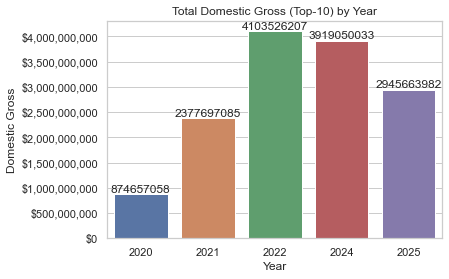

In [49]:
# making the data group by years
yearly_totals = (all_movies
                 .groupby("Year", as_index=False)["Domestic Gross"].sum())

ax = sns.barplot(data=yearly_totals, x="Year", y="Domestic Gross")
# making the y axis show billions because otherwise the decimals are hard to tell 
ax.yaxis.set_major_formatter(fmt_billions)
ax.bar_label(ax.containers[0], fmt='%.0f')
plt.title("Total Domestic Gross (Top-10) by Year")
plt.ylabel("Domestic Gross")
plt.xlabel("Year")



# How  did the top gross change from each year?

## I chose a line plot because it shows the best trends over time

Text(0.5, 0, 'Year')

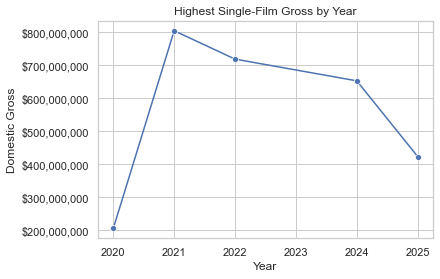

In [51]:
# groups each year
yearly_top = (all_movies
              .groupby("Year", as_index=False)["Domestic Gross"].max())

ax = sns.lineplot(data=yearly_top, x="Year", y="Domestic Gross", marker="o")
# same this shows the billions
ax.yaxis.set_major_formatter(fmt_billions)
plt.title("Highest Single-Film Gross by Year")
plt.ylabel("Domestic Gross")
plt.xlabel("Year")



# Which studio appeared in the top 10 across 6 years?

## Made the numbers on the bottom to make easier to read

Text(0, 0.5, '')

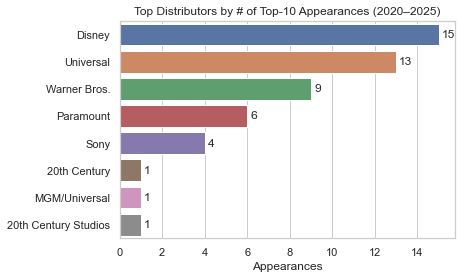

In [52]:
studio_counts = (all_movies["Distributor"]
                 # counting the values 
                 .value_counts()
                 .head(10)
                 #the distributor names were dissappear so running this fixes it
                 .reset_index()
                 # renamed to make it clearer
                 .rename(columns={"index":"Distributor", "Distributor":"Count"}))

ax = sns.barplot(data=studio_counts, y="Distributor", x="Count")
ax.bar_label(ax.containers[0], padding=3)
plt.title("Top Distributors by # of Top-10 Appearances (2020–2025)")
plt.xlabel("Appearances")
plt.ylabel("")



# Which film had the highest gross of all?

## I saw instead of finding the max I could nlargest so I decided to do that instead because I was interested on how it worked/ it is more effiecent

## The x axis was cluttered so I made the plot bigger

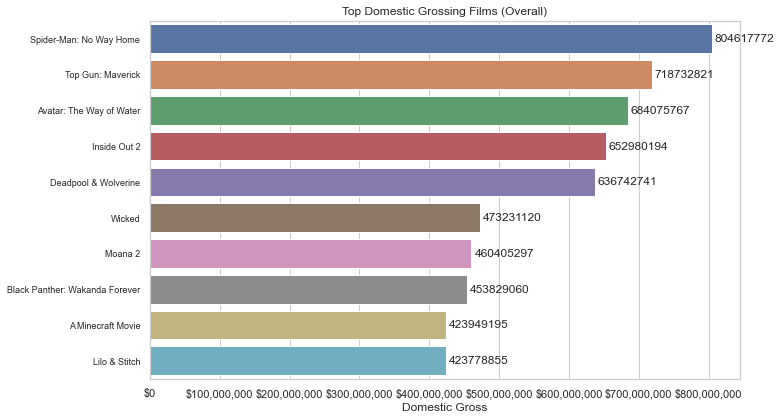

In [61]:
#this grabs the top 10 from the gross column
top_overall = all_movies.nlargest(10, "Domestic Gross")  # change 10→1 to show only winner
# makes it bigger
fig, ax = plt.subplots(figsize=(11,6))
sns.barplot(data=top_overall, y="Title", x="Domestic Gross", ax=ax)
# helps with the x axis formatting
ax.yaxis.set_tick_params(labelsize=9)
ax.xaxis.set_major_formatter(fmt_billions)
ax.bar_label(ax.containers[0], fmt='%.0f', padding=3)
plt.title("Top Domestic Grossing Films (Overall)")
plt.xlabel("Domestic Gross")
plt.ylabel("")
plt.tight_layout()





# Which percentage of the top 10 films each year were released by Disney?

Text(0.5, 0, 'Year')

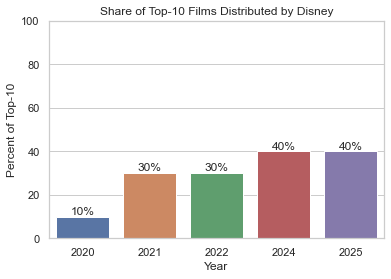

In [62]:
per_disney = (all_movies.assign(is_disney = all_movies["Distributor"]
                                #makes a true false for if it was made by disney
                                .str.contains("Disney", case=False, na=False))
                         .groupby("Year")["is_disney"]
                         .mean()
                         .mul(100)
                         .reset_index()
                         .rename(columns={"is_disney":"Percent"}))

ax = sns.barplot(data=per_disney, x="Year", y="Percent")
ax.bar_label(ax.containers[0], fmt='%.0f%%')
plt.ylim(0, 100)
plt.title("Share of Top-10 Films Distributed by Disney")
plt.ylabel("Percent of Top-10")
plt.xlabel("Year")



# Here is what I typed into chatgpt

## How to grab a table when it has a cell with rowspan?

## What are the different ways to grab a table? (It showed me a way where I could find the name of the table)

## how to combine dataframes into one singular dataframe?

## what is the concat function?

## What is the groupby method and how do I use it?